In [1]:
import json
import boto3
import base64
import re
import os
from PIL import Image
import glob
import time
from importlib import reload
import pandas as pd

pd.set_option("display.max_colwidth", None)
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

# custom imports 
# os.chdir('..')
print("CWD:", os.getcwd())
# from langchain_aws import ChatBedrock
bedrock_runtime = boto3.client("bedrock-runtime")

CWD: /Users/jaynmar/source_code_github/ai-description


In [2]:
# change into and out of src directory for imports
os.chdir('src')
import image_captioning_assistant.generate.prompts as p
import image_captioning_assistant.generate.generate_bias_analysis as gba
import image_captioning_assistant.generate.generate_structured_metadata as gsm
import image_captioning_assistant.generate.utils as gen_utils
os.chdir('..')

In [3]:
def print_output(output):
    s = pd.Series(output["metadata"])
    display(pd.DataFrame({"Metadata Item": s.index, "Output from AI Model": s.values}))
    bias_list = output["bias_analysis"]
    # Convert to DataFrame with multi-index
    multi_index_data = []
    for i, bias_dict in enumerate(bias_list):
        for key, value in bias_dict.items():
            multi_index_data.append(((i + 1, key), value))

    # Create DataFrame
    multi_index = pd.MultiIndex.from_tuples(
        [item[0] for item in multi_index_data], names=["Bias ID", "Bias Item"]
    )
    df = pd.DataFrame(
        {"Output from AI Model": [item[1] for item in multi_index_data]},
        index=multi_index,
    )
    display(df)

In [4]:
# def convert_png_to_jpg(folder_path):
#     for file_name in os.listdir(folder_path):
#         if file_name.endswith('.png'):
#             png_file_path = os.path.join(folder_path, file_name)
#             jpg_file_name = file_name[:-4] + '.jpg'
#             jpg_file_path = os.path.join(folder_path, jpg_file_name)

#             with Image.open(png_file_path) as img:
#                 rgb_img = img.convert('RGB')
#                 rgb_img.save(jpg_file_path, 'JPEG')

#     print("Conversion completed.")
# convert_png_to_jpg('celebrity_data')

In [5]:
reload(p)
from jinja2 import Template
def extract_json_from_text(text):
    # remove chain of thought
    text = text.split(p.COT_TAG_END)[1].strip()
    try:
        return json.loads(text)
    except json.JSONDecodeError:
        print("Could not decode")
        print(text)
        raise json.JSONDecodeError


llm_blob = Template(""" Here is the result!!
{{COT_TAG_END}}
{"list_items": ["l1", "l2"],
    "nested": {
        "a":1,
        "b":[2]
        }
    }
  """).render(COT_TAG_END=p.COT_TAG_END)
res = extract_json_from_text(llm_blob)
assert type(res) == dict and res == {
    "list_items": ["l1", "l2"],
    "nested": {"a": 1, "b": [2]},
}

In [29]:
def extract_metadata_from_image(image_path, image_path_back=None, return_all=False):
    # Read and encode the image
    with open(image_path, "rb") as image_file:
        image_data = base64.b64encode(image_file.read()).decode("utf-8")
    if image_path_back:
        with open(image_path_back, "rb") as image_file_back:
            image_data_back = base64.b64encode(image_file_back.read()).decode("utf-8")

    # get system and user prompts
    system_prompt = p.system_prompt

    # Create the message with text and image
    messages_dict = {}
    messages_dict["anthropic.claude-3-5-sonnet-20240620-v1:0"] = [
        {
            "role": "user",
            "content": [
                {
                    "type": "image",
                    "source": {
                        "type": "base64",
                        "media_type": "image/jpeg",
                        "data": image_data,
                    },
                },
                *[
                    {
                        "type": "image",
                        "source": {
                            "type": "base64",
                            "media_type": "image/jpeg",
                            "data": image_data_back,
                        },
                    } if image_path_back else None
                ],
                {"type": "text", "text": p.user_prompt},
            ],
        },
        {
            "role": "assistant",
            "content": [{"type": "text", "text": p.assistant_start}],
        },
    ]
    # return messages_dict["anthropic.claude-3-5-sonnet-20240620-v1:0"]
    messages_dict["amazon.nova-pro-v1:0"] = [
        {
            "role": "user",
            "content": [
                {
                    # "type": "image",
                    "image": {"format": "jpeg", "source": {"bytes": image_data}}
                },
                {
                    # "type": "text",
                    "text": p.user_prompt
                },
            ],
        },
        {"role": "assistant", "content": [{"text": p.assistant_start}]},
    ]

    request_bodies = {}
    # Prepare the request bodies
    request_bodies["anthropic.claude-3-5-sonnet-20240620-v1:0"] = {
        "anthropic_version": "bedrock-2023-05-31",
        "system": p.system_prompt,
        "max_tokens": 4096,
        "temperature": 0.0,
        "top_p": 0.6,
        # "top_k": 250,
        # "stop_sequences": [''],
        "messages": messages_dict["anthropic.claude-3-5-sonnet-20240620-v1:0"],
    }

    request_bodies["amazon.nova-pro-v1:0"] = {
        "schemaVersion": "messages-v1",
        "messages": messages_dict["amazon.nova-pro-v1:0"],
        "system": [{"text": p.system_prompt}],
        "toolConfig": {},
        "inferenceConfig": {
            "max_new_tokens": 4096,
            "top_p": 0.6,
            "top_k": 250,
            "temperature": 0.0,
            # ,"stopSequences": ['']
        },
    }

    # Send the request to Bedrock
    modelId = "anthropic.claude-3-5-sonnet-20240620-v1:0"
    # modelId='amazon.nova-pro-v1:0'
    # print(modelId)
    # print(request_bodies[modelId])
    response = bedrock_runtime.invoke_model(
        modelId=modelId, body=json.dumps(request_bodies[modelId])
    )

    # Process the response
    result = json.loads(response["body"].read())
    if modelId == "anthropic.claude-3-5-sonnet-20240620-v1:0":
        llm_output = result["content"][0]["text"]
    elif modelId == "amazon.nova-pro-v1:0":
        llm_output = result["output"]["message"]["content"][0]["text"]
    else:
        raise RuntimeException("ModelId " + modelId + " must be set up")
    return llm_output if return_all else extract_json_from_text(llm_output)




Be less specific on objects that don't matter, like house, not windows, not parts of the poster, but that it's a poster

make sure to characterize the object itself like that it's a black and white photo

In [56]:
reload(p)
reload(gsm)
return_all = True
image_path = 'research/ground_truth/images'
work_id = '880ht76hj7-cor'
results = gsm.extract_metadata_from_image(
    f"{image_path}/{work_id}_front.jpg", image_path_back=f"{image_path}/{work_id}_back.jpg"
    , return_all=return_all
    # , modelId="us.anthropic.claude-3-5-sonnet-20241022-v2:0"
)

if return_all:
    print(p.COT_TAG)
    print(results)
else:
    print_output(results)

<object_detail_and_bias_analysis>


1. Breakdown of the object:
- The object consists of two images: a photograph on the front and the back of a postcard.
- Front image: A sepia-toned photograph showing multiple people working in a cotton field.
- Back image: The reverse side of a postcard with handwritten text and printed elements.

2. Sections with text:
Front image:
- Printed text at the bottom: "COTTON PICKING IN THE SUNNY SOUTH"
- Copyright information: "COPYRIGHT 1908 BY H.T.E.B."

Back image:
- Printed text: "POST CARD", "CORRESPONDENCE", "NAME AND ADDRESS", "PLACE POSTAGE STAMP HERE"
- Handwritten text in two areas

3. Translation and transcription attempts:
Front image:
- "COTTON PICKING IN THE SUNNY SOUTH" - Clear printed text, no alternative interpretations needed.
- "COPYRIGHT 1908 BY H.T.E.B." - Clear printed text, though the initials could potentially be interpreted differently.

Back image:
- Printed text is clear and standard for postcards of the era.
- Handwritten text

In [52]:
reload(p)
return_all = True
image_path = 'research/ground_truth/images'
work_id = '989r2280h5-cor'
results = gsm.extract_metadata_from_image(
    f"{image_path}/{work_id}_front.jpg", image_path_back=f"{image_path}/{work_id}_back.jpg"
    , return_all=return_all
    # , modelId="us.anthropic.claude-3-5-sonnet-20241022-v2:0"
)

if return_all:
    print(p.COT_TAG)
    print(results)
else:
    print_output(results)

<object_detail_and_bias_analysis>


1. Breaking down the object:
The object consists of two images: a color photograph on the front and a postcard back on the reverse.

Front image:
- A person wearing a red and white polka dot headscarf
- The person has dark skin and appears to be of African descent
- They are smoking a pipe
- Wearing a white shirt or top
- Holding what appears to be an infant wrapped in cloth
- Background suggests an outdoor setting with blurred structures

Reverse image:
- Standard postcard layout
- Printed text in English
- Space for stamp and address
- Publication information

2. Identifying text sections:
Front image: No visible text
Reverse image:
- Printed title at top
- "POST CARD" printed in large letters
- "PLACE STAMP HERE" in a box
- Publication information at bottom

3. Transcription and translation attempts:
Front image: No text to transcribe

Reverse image:
Printed text:
"Haitian mother with offspring (Farca) - Haiti."
"POST CARD"
"PLACE STAMP HERE"
"Dis

In [45]:
reload(p)
reload(gsm)
return_all = True
image_path = 'research/research_data'
work_id = 'clear_10'
results = gsm.extract_metadata_from_image(
    f"{image_path}/{work_id}.jpg", image_path_back=None
    , return_all=return_all
    # , modelId="us.anthropic.claude-3-5-sonnet-20241022-v2:0"
)

if return_all:
    print(p.COT_TAG)
    print(results)
else:
    print_output(results)

<object_detail_and_bias_analysis>


1. Breaking down the object:
- Black and white portrait photograph
- Woman in close-up view
- 1920s-style cloche hat with decorative element
- Distinctive makeup, including dark lipstick and emphasized eyes
- Facial features include a beauty mark on the right cheek
- Partial view of a garment with embellishment visible on the shoulder
- Studio-style lighting creating dramatic shadows and highlights

2. Identifying text sections:
- No visible text in the image

3. Translation and transcription:
- Not applicable as there is no text to transcribe or translate

4. Potential metadata elements:
- Description: Detailed summary of the photograph's content
- Date: Circa 1920s (based on fashion and photographic style)
- Location: Studio setting (inferred from lighting and composition)
- Publication info: None visible
- Contextual info: 
  * Fashion of the 1920s
  * Studio portrait photography techniques of the era
  * Makeup and beauty standards of the time
- 

In [42]:
reload(gsm)
print("Redone Woman Example:")
print_output(gsm.extract_json_from_text(results))

Redone Woman Example:


,Metadata Item,Output from AI Model
0,description,A black and white professional studio portrait photograph from the late 1920s or early 1930s featuring a close-up view of a person wearing a cloche hat with decorative bow detail. The photograph demonstrates classic Hollywood glamour photography techniques with dramatic lighting and soft focus effects. The subject is wearing what appears to be a satin or silk-like garment.
1,transcription,"{'print': [], 'handwriting': []}"
2,date,Circa 1920s-1930s
3,location,Studio setting
4,publication_info,"[Professional studio portrait photograph, Hollywood glamour style]"
5,contextual_info,"[Example of Hollywood glamour photography technique, Represents 1920s-1930s fashion and beauty standards, Shows period-specific makeup and styling techniques]"
6,objects,"[cloche hat, bow decoration, satin garment]"
7,actions,"[posing, gazing]"
8,people,[adult in formal portrait]


Output from AI Model
Bias ID Bias Item                                                                                                                                                                                                                         
1       bias_level                                                                                                                                                                                                                     Low
        bias_type                                                                                                                                                                                                                   gender
        explanation  The image reflects period-specific beauty and fashion standards of the 1920s-1930s. While these standards were restrictive by modern measures, this represents historical documentation rather than intentional bias.

In [54]:
reload(gsm)
print("Langmuir Example #1:", work_id)
print_output(gsm.extract_json_from_text(results))

Langmuir Example #1: 989r2280h5-cor


,Metadata Item,Output from AI Model
0,description,"Color photograph of an adult person with dark skin wearing a red and white polka dot headscarf, smoking a pipe, and holding an infant wrapped in cloth. The setting appears to be outdoors in Haiti."
1,transcription,"{'print': ['Haitian mother with offspring (Farca) - Haiti.', 'POST CARD', 'PLACE STAMP HERE', 'Distributed by W. E. Leavitt, Port-au-Prince, Haiti', 'F3582'], 'handwriting': []}"
2,date,Circa 1950s-1960s
3,location,Haiti
4,publication_info,"[Distributed by W. E. Leavitt, Port-au-Prince, Haiti]"
5,contextual_info,"[Depicts aspects of daily life in Haiti, Representation of adult caring for infant, Postcard format suggests tourist or documentary purpose]"
6,objects,"[pipe, headscarf, infant, white shirt]"
7,actions,"[smoking, holding]"
8,people,"[adult, infant, black person]"


Output from AI Model
Bias ID Bias Item                                                                                                                                                                                                                                                                                                                      
1       bias_level                                                                                                                                                                                                                                                                                                               Medium
        bias_type                                                                                                                                                                                                                                                                                                              cultural
        explanation  The use of the term 'offspring' in the original title could be seen as dehumanizing when referring to a human baby. Additionally, the image and its presentation as a postcard may contribute to the exoticization of Haitian people and culture, potentially reinforcing cultural stereotypes of the time period.
2       bias_level                                                                                                                                                                                                                                                                                                                  Low
        bias_type                                                                                                                                                                                                                                                                                                                gender
        explanation                                                                                           The original title assumes the adult's gender and relationship to the infant. While this may be accurate, it's not definitively clear from the image alone and could reinforce gender stereotypes about caregiving roles.

In [57]:
reload(gsm)
print("Langmuir Example #2:", work_id)
print_output(gsm.extract_json_from_text(results))

Langmuir Example #2: 880ht76hj7-cor


,Metadata Item,Output from AI Model
0,description,"A sepia-toned photograph on a postcard depicting multiple individuals, including adults and children, harvesting cotton in a field. The image shows people bent over cotton plants, picking cotton and placing it into baskets. Trees are visible in the background. The postcard includes the caption 'COTTON PICKING IN THE SUNNY SOUTH' and copyright information from 1908."
1,transcription,"{'print': ['COTTON PICKING IN THE SUNNY SOUTH', 'COPYRIGHT 1908 BY H.T.E.B.', 'POST CARD', 'CORRESPONDENCE', 'NAME AND ADDRESS', 'PLACE POSTAGE STAMP HERE'], 'handwriting': ['Dear Mabel, How are you? I am having a fine time here. Wish you were here too. [Aunt] Jennie', 'Mabel Ward']}"
2,date,1908
3,location,Southern United States
4,publication_info,[Copyright 1908 by H.T.E.B.]
5,contextual_info,"[Cotton harvesting in early 20th century America, Postcard communication, Labor practices in the American South]"
6,objects,"[Cotton plants, Baskets, Trees, Postcard]"
7,actions,"[Picking cotton, Carrying baskets, Bending over]"
8,people,"[Adults, Children, Workers]"


Output from AI Model
Bias ID Bias Item                                                                                                                                                                                                                                                                     
1       bias_level                                                                                                                                                                                                                                                              Medium
        bias_type                                                                                                                                                                                                                                                             cultural
        explanation                                                                      The phrase 'SUNNY SOUTH' on the postcard potentially romanticizes or trivializes the harsh realities of cotton picking and labor conditions in the Southern United States during this period.
2       bias_level                                                                                                                                                                                                                                                              Medium
        bias_type                                                                                                                                                                                                                                                               ageism
        explanation                                                                                                          The image depicts child labor in cotton picking, which may normalize exploitative practices of the time without providing appropriate historical context.
3       bias_level                                                                                                                                                                                                                                                                 Low
        bias_type                                                                                                                                                                                                                                                               racial
        explanation  While the image likely depicts African American workers, given the historical context of cotton picking in the American South, the postcard format and lack of context may trivialize the complex racial dynamics and exploitation inherent in this labor system.

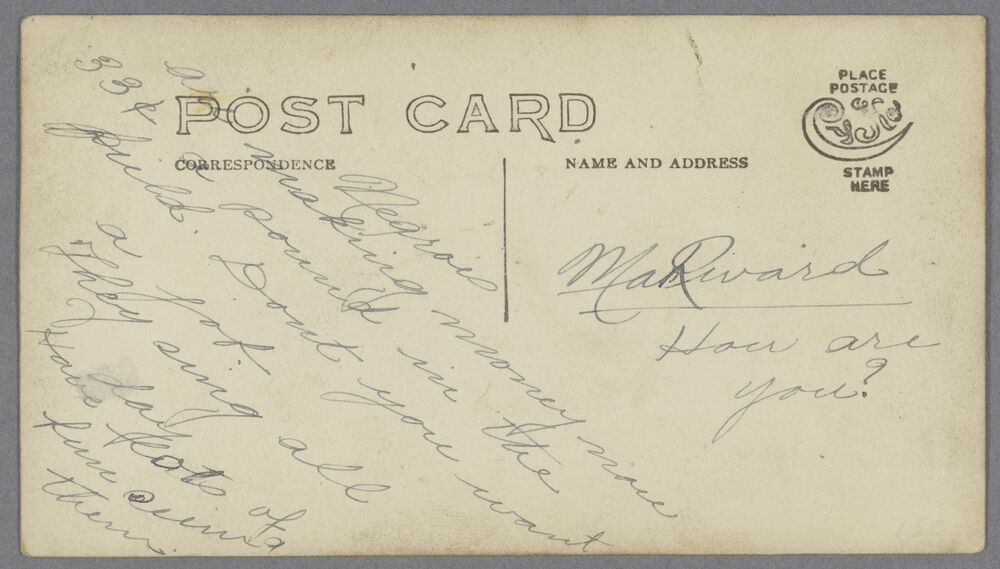

In [ ]:

from pathlib import Path
from PIL import Image
img_path = f"{image_path}/{work_id}_back.jpg"
# display the image in the notebook
if Path(img_path).exists():
    display(Image.open(img_path))

In [31]:
results[0]['content'][0]['source']['data'] == results[0]['content'][1]['source']['data']

False

In [ ]:
ground_truth_df = pd.read_csv('research/ground_truth/ground_truth_04feb2025.csv')
ground_truth_df[ground_truth_df.work_id=='880ht76hj7-cor']

### Now update to use the generate API

In [14]:
reload(p)
reload(gba)
reload(gsm)
reload(gen_utils);

In [10]:
gen_utils.get_front_and_back_bytes_from_paths(f"{image_path}/{work_id}_front.jpg", image_path_back=f"{image_path}/{work_id}_back.jpg")

[b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x02\x9e\x02\x9e\x00\x00\xff\xed\x1e\xeePhotoshop 3.0\x008BIM\x03\xed\x00\x00\x00\x00\x00\x10\x02\x9e\x00\x00\x00\x01\x00\x01\x02\x9e\x00\x00\x00\x01\x00\x018BIM\x03\xf3\x00\x00\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x01\x008BIM\x03\xf5\x00\x00\x00\x00\x00H\x00/ff\x00\x01\x00lff\x00\x06\x00\x00\x00\x00\x00\x01\x00/ff\x00\x01\x00\xa1\x99\x9a\x00\x06\x00\x00\x00\x00\x00\x01\x002\x00\x00\x00\x01\x00Z\x00\x00\x00\x06\x00\x00\x00\x00\x00\x01\x005\x00\x00\x00\x01\x00-\x00\x00\x00\x06\x00\x00\x00\x00\x00\x018BIM\x03\xf8\x00\x00\x00\x00\x00p\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x03\xe8\x00\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x03\xe8\x00\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x03\xe8\x00\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xf

In [22]:
return_all = True
image_path = 'research/ground_truth/images'
work_id = '880ht76hj7-cor'
metadata = gsm.generate_structured_metadata(
    gen_utils.get_front_and_back_bytes_from_paths(f"{image_path}/{work_id}_front.jpg", image_path_back=f"{image_path}/{work_id}_back.jpg"),
    {   
        "model": "anthropic.claude-3-5-sonnet-20240620-v1:0",
        # "system": p.system_prompt,
        "max_tokens": 4096, #30000,
        "temperature": 0.0,
        "top_p": 0.6
    },
    "")


In [23]:
metadata.model_dump()

{'description': 'The image shows a group of people, including men, women, and children, picking cotton in a large field. The workers are spread out across the field, bending over to pick cotton from low-growing plants. Some are carrying baskets or sacks to collect the cotton. In the background, there are trees lining the edge of the field. The image appears to be a historical photograph, likely from the late 19th or early 20th century, depicting cotton harvesting in the southern United States.',
 'transcription': 'Cotton Picking in the Sunny South. Copyright 1908 by H.T.E.B.',
 'people_and_groups': ['Cotton pickers',
  'Agricultural workers',
  'Men',
  'Women',
  'Children'],
 'date': '1908',
 'location': 'Southern United States',
 'publication_info': 'Copyright 1908 by H.T.E.B. Published as a postcard.',
 'contextual_info': 'This image depicts cotton harvesting in the American South during the early 20th century. Cotton was a major crop in the southern states, and its harvesting was 

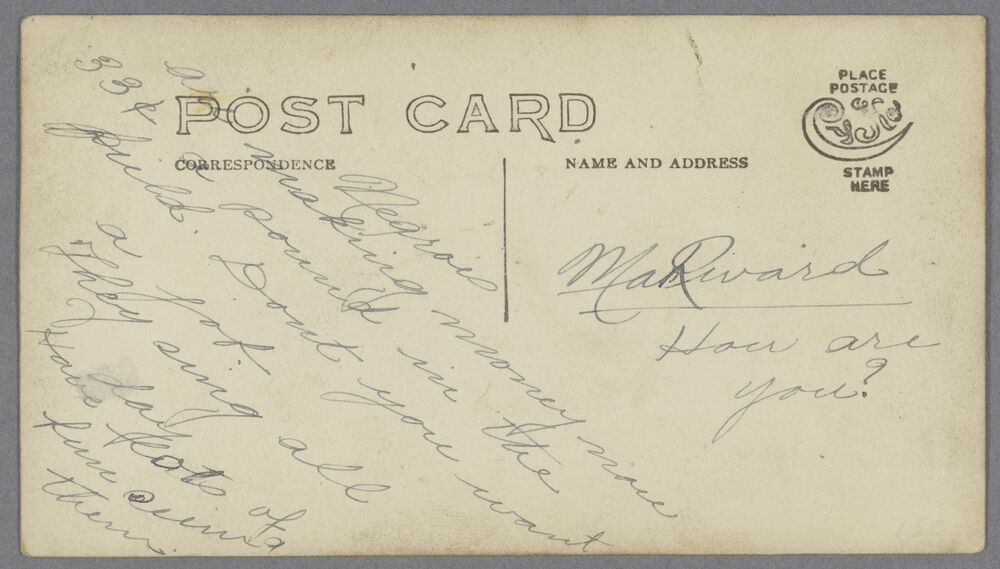

In [ ]:

from pathlib import Path
from PIL import Image
img_path = f"{image_path}/{work_id}_back.jpg"
# display the image in the notebook
if Path(img_path).exists():
    display(Image.open(img_path))

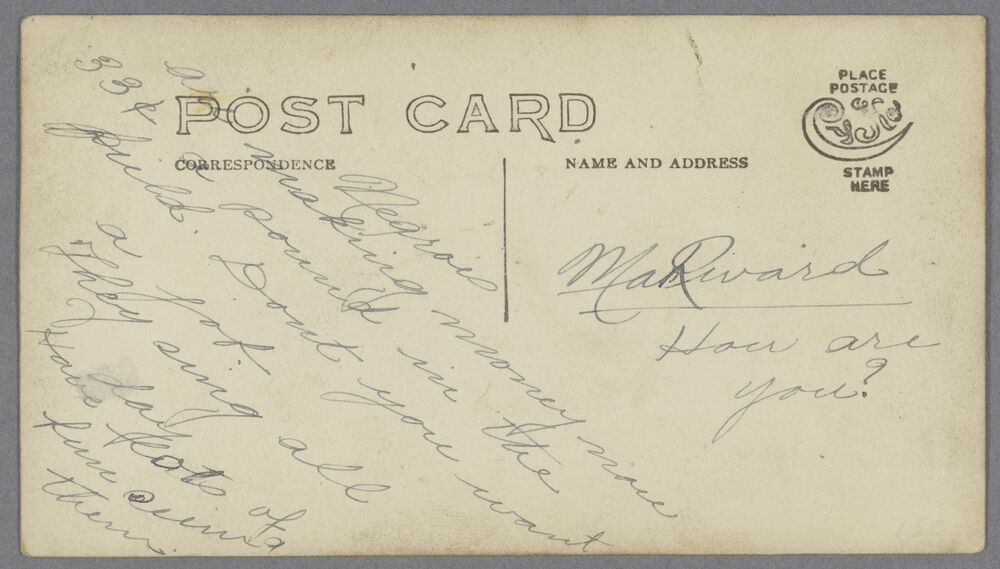

In [ ]:

from pathlib import Path
from PIL import Image
img_path = f"{image_path}/{work_id}_back.jpg"
# display the image in the notebook
if Path(img_path).exists():
    display(Image.open(img_path))

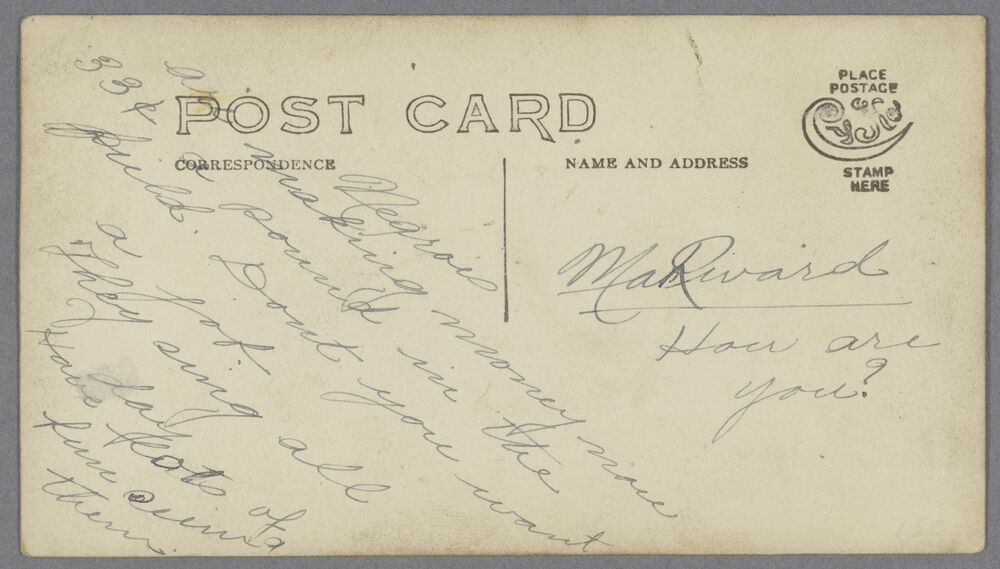

In [ ]:

from pathlib import Path
from PIL import Image
img_path = f"{image_path}/{work_id}_back.jpg"
# display the image in the notebook
if Path(img_path).exists():
    display(Image.open(img_path))

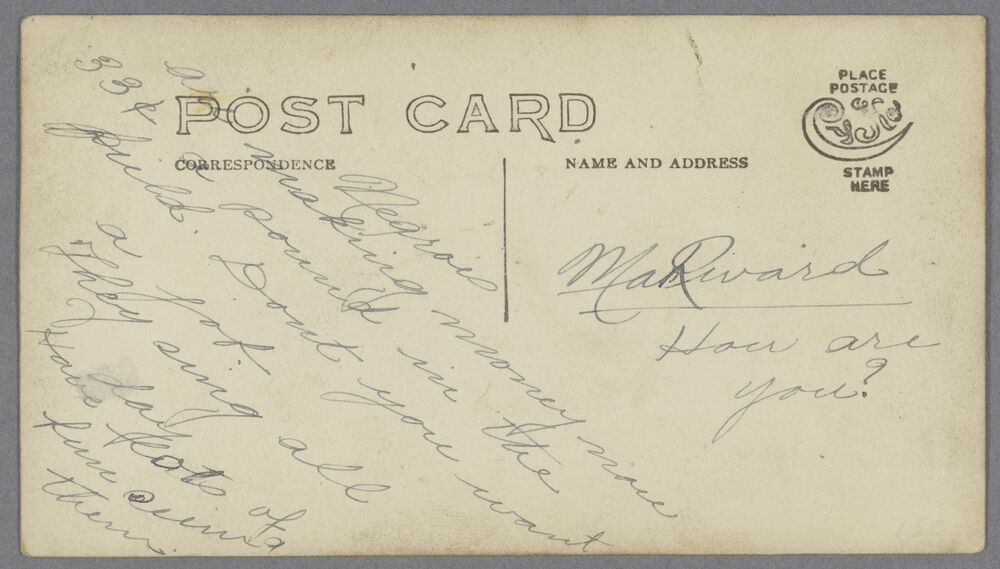

In [ ]:

from pathlib import Path
from PIL import Image
img_path = f"{image_path}/{work_id}_back.jpg"
# display the image in the notebook
if Path(img_path).exists():
    display(Image.open(img_path))

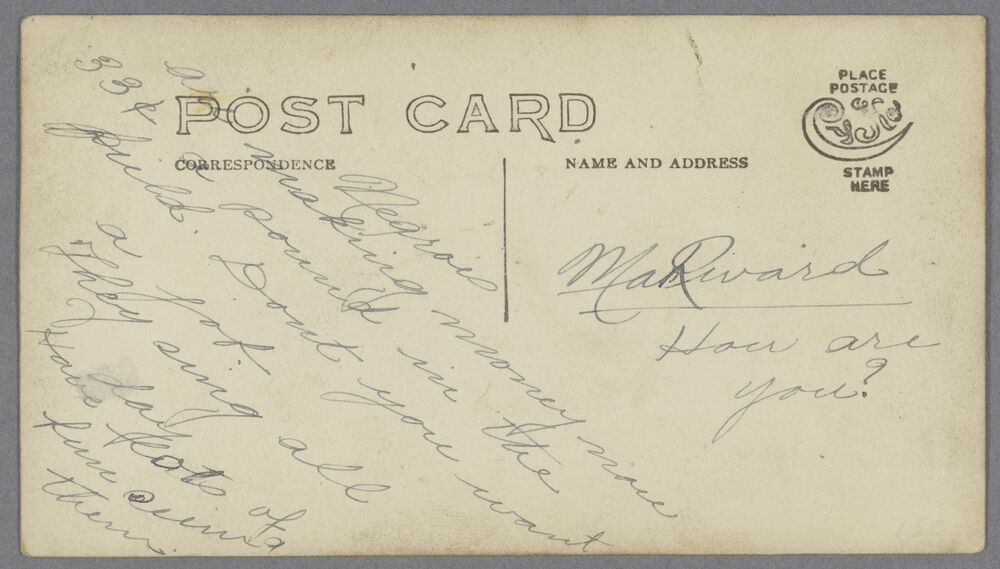

In [ ]:

from pathlib import Path
from PIL import Image
img_path = f"{image_path}/{work_id}_back.jpg"
# display the image in the notebook
if Path(img_path).exists():
    display(Image.open(img_path))

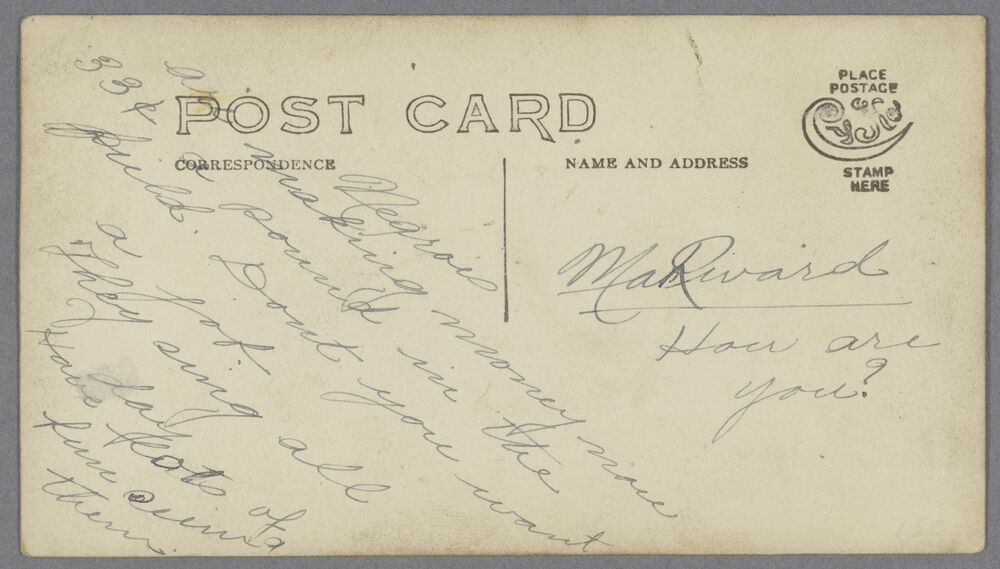

In [ ]:

from pathlib import Path
from PIL import Image
img_path = f"{image_path}/{work_id}_back.jpg"
# display the image in the notebook
if Path(img_path).exists():
    display(Image.open(img_path))

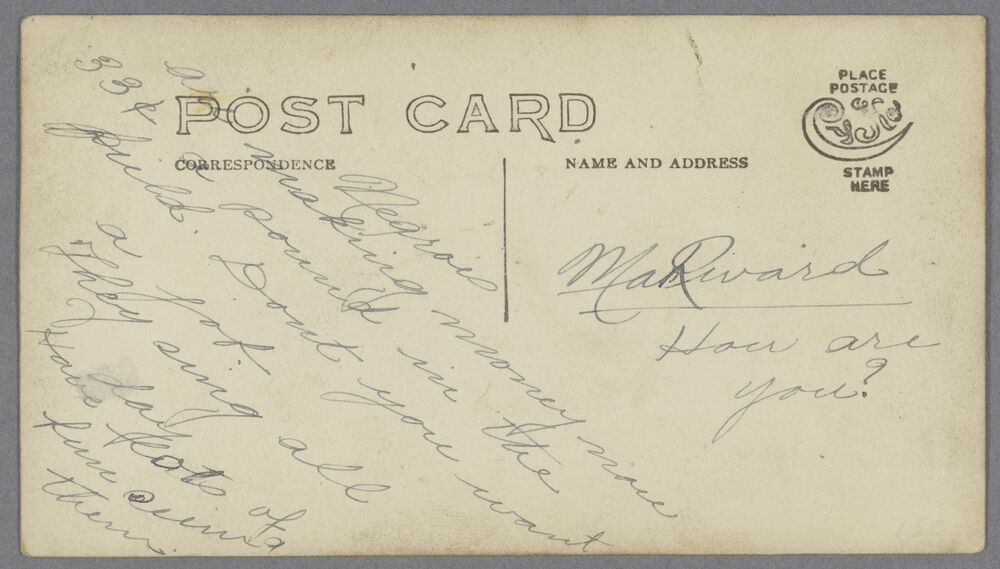

In [ ]:

from pathlib import Path
from PIL import Image
img_path = f"{image_path}/{work_id}_back.jpg"
# display the image in the notebook
if Path(img_path).exists():
    display(Image.open(img_path))